# Example of usage Spark OCR for de-identify Dicom documents using NLP pipeline and DicomDeidentifier

## Install spark-ocr python packge
You'll need to provide:
- license
- path to `spark-ocr-assembly-[version].jar` and `spark-nlp-jsl-[version]`
- or `secret` for Spark OCR and `nlp_secret` for Spark NLP Internal
- `aws_access_key` and `aws_secret_key`for download pretrained models

For more details about Dicom de-identification please read:

 - [DICOM de-identification at scale in Visual NLP — Part 1.](https://medium.com/john-snow-labs/dicom-de-identification-at-scale-in-visual-nlp-part-1-68784177f5f0)

 - [DICOM de-identification at scale in Visual NLP — Part 2.](https://medium.com/john-snow-labs/dicom-de-identification-at-scale-in-visual-nlp-part-2-361af5e36412)

 - [DICOM de-identification at scale in Visual NLP — Part 3.](https://medium.com/john-snow-labs/dicom-de-identification-at-scale-in-visual-nlp-part-3-61cecc3adb56)

In [1]:
license = ""
secret = ""
nlp_secret = ""
aws_access_key = ""
aws_secret_key = ""

version = secret.split("-")[0]
spark_ocr_jar_path = "../../../target/scala-2.12"

# Install and Start Spark OCR with Healthcare NLP

Define the variables from your license file before running this notebook.

> `spark_ocr_jar_path` is used internally for testing and should usually be ignored.

## Variables

```python
# Required variables from your license file:
# license = "..."
# secret = "..."          # Visual Product Secret
# nlp_secret = "..."      # Healthcare Product Secret
# public_version = "..."  # Open Source Version
# aws_access_key = "..."
# aws_secret_key = "..."
# spark_ocr_jar_path = None
```

## Install Visual NLP

```python
ocr_version = secret.split("-")[0]

!pip install --upgrade -q spark-ocr==$ocr_version \
  --extra-index-url=https://pypi.johnsnowlabs.com/$secret \
  --upgrade
```

## Install Healthcare NLP

```python
jsl_version = nlp_secret.split("-")[0]

!pip -q install --upgrade spark-nlp-jsl==$jsl_version \
  --extra-index-url https://pypi.johnsnowlabs.com/$nlp_secret
```

## Install Open-Source Spark NLP and PySpark

Check your license file for the correct open-source Spark NLP version.

```python
public_version = "6.4.2"
!pip install --upgrade -q pyspark==3.4.0 spark-nlp==$public_version
```

## Install Java 8

```python
!apt-get update
!apt-get install -y openjdk-8-jdk
```

<div style="color: red; font-size: 28px; font-weight: bold;">
⚠️ WARNING: RESTART YOUR SESSION AFTER INSTALLING JSL COMPONENTS.
</div>

## Start Spark OCR

```python
from sparkocr import start
import os
from pyspark import SparkConf

if license:
    os.environ["JSL_OCR_LICENSE"] = license
    os.environ["SPARK_NLP_LICENSE"] = license

if aws_access_key:
    os.environ["AWS_ACCESS_KEY"] = aws_access_key
    os.environ["AWS_SECRET_ACCESS_KEY"] = aws_secret_key

# nlp_internal is the Healthcare NLP version.
# Use this when running Visual NLP with Healthcare NLP.

# When starting a Visual NLP session, it needs either secret/jar_path
spark = start(
    secret=secret,
    nlp_secret=nlp_secret,
    jar_path=spark_ocr_jar_path,
    use_gpu=True,
    nlp_internal="6.4.1"
)

spark
```

## Initialization of spark session

In [ ]:
from sparkocr import start
import os 

if license:
    os.environ['JSL_OCR_LICENSE'] = license
    os.environ['SPARK_NLP_LICENSE'] = license

if aws_access_key:
    os.environ['AWS_ACCESS_KEY'] = aws_access_key
    os.environ['AWS_SECRET_ACCESS_KEY'] = aws_secret_key

os.environ["TF_CPP_MIN_LOG_LEVEL"] = "3"

spark = start(secret=secret,
              nlp_secret=nlp_secret,
              jar_path=spark_ocr_jar_path,
              nlp_internal="6.3.0")

spark

Spark version: 3.4.1
Spark NLP version: 6.3.2
Spark NLP for Healthcare version: 6.2.2
Spark OCR version: 6.3.1rc5



## Import Spark OCR transformers and Spark NLP annotators

In [3]:
import os
import sys

from sparknlp.annotator import *
from sparknlp.base import *
import sparknlp_jsl
from sparknlp_jsl.annotator import *

import sparkocr
from sparkocr.transformers import *
from sparkocr.utils import *
from sparkocr.enums import *

from pyspark.ml import PipelineModel, Pipeline

## Define de-identification  NLP pipeline

In [4]:
def deidentification_nlp_pipeline(input_column, prefix = "", model="ner_deid_large"):
    document_assembler = DocumentAssembler() \
        .setInputCol(input_column) \
        .setOutputCol(prefix + "document_raw")

    cleanUpPatterns = ["<[^>]>"]
    documentNormalizer = DocumentNormalizer() \
      .setInputCols(prefix + "document_raw") \
      .setOutputCol(prefix + "document") \
      .setAction("clean") \
      .setPatterns(cleanUpPatterns) \
      .setReplacement(" ") \
      .setPolicy("pretty_all")

    # Sentence Detector annotator, processes various sentences per line
    sentence_detector = SentenceDetector() \
        .setInputCols([prefix + "document"]) \
        .setOutputCol(prefix + "sentence")

    tokenizer = Tokenizer() \
        .setInputCols([prefix + "sentence"]) \
        .setOutputCol(prefix + "token")

    # Clinical word embeddings
    word_embeddings = WordEmbeddingsModel.pretrained("embeddings_clinical", "en", "clinical/models") \
        .setInputCols([prefix + "sentence", prefix + "token"]) \
        .setOutputCol(prefix + "embeddings")

    clinical_ner = MedicalNerModel.pretrained(model, "en", "clinical/models") \
        .setInputCols([prefix + "sentence", prefix + "token", prefix + "embeddings"]) \
        .setOutputCol(prefix + "ner")

    custom_ner_converter = NerConverter() \
        .setInputCols([prefix + "sentence", prefix + "token", prefix + "ner"]) \
        .setOutputCol(prefix + "ner_chunk") \
        .setWhiteList(['NAME', 'AGE', 'CONTACT',
                   'LOCATION', 'PROFESSION', 'PERSON', 'DATE', 'ID','DOCTOR'])
    
    # here we merge the rule based approach `entity` with the ML approach `ner_chunk`
    chunk_merge = ChunkMergeApproach()\
        .setInputCols("entity","ner_chunk")\
        .setOutputCol("deid_merged_chunk")

    nlp_pipeline = Pipeline(stages=[
            document_assembler,
            documentNormalizer,
            sentence_detector,
            tokenizer,
            word_embeddings,
            clinical_ner,
            custom_ner_converter,
            chunk_merge
        ])
    empty_data = spark.createDataFrame([[""]]).toDF(input_column)
    nlp_model = nlp_pipeline.fit(empty_data)
    return nlp_model

## Define OCR transformers and pipeline for image deidentification

<b>DicomDeidentifier:</b> this annotator allows deidentification of Dicom Images using Dicom metadata contained in the same Dicom document. This is a rule-based annotator which leverages PHI collected from the metadata like patient names or test results to deidentify PHI contained on images(pixels) in the Dicom file. It also supports a black list parameter to remove specific content present in the image text.
This annotator can work either in isolation or combined with Spark NLP for Healthcare NER models. By using ChunkMergeApproach, NER models can be combined with DicomDeidentifier to deliver an ensemble of ML and Rule Based techniques to cover the most challenging de-identification scenarios.

In [10]:
from pyspark.ml import PipelineModel, Pipeline

dicom_to_metadata = DicomToMetadata() \
    .setInputCol("content") \
    .setOutputCol("metadata") \
    .setKeepInput(True)

dicom_to_image = DicomToImageV3() \
    .setInputCols(["content"]) \
    .setOutputCol("image_raw") \
    .setKeepInput(True)

text_detector = ImageTextDetectorV2 \
    .pretrained("image_text_detector_v2", "en", "clinical/ocr") \
    .setInputCol("image_raw") \
    .setOutputCol("text_regions") \
    .setWithRefiner(False) \
    .setLinkThreshold(0.7)

ocr = ImageToTextV3() \
    .setInputCols(["image_raw", "text_regions"]) \
    .setOutputCol("text")

deidentifier = DicomDeidentifier() \
    .setInputCols(["positions", "metadata"]) \
    .setOutputCol("entity") \
    .setKeepInput(True) \
    .setBlackList(["acc"])

# converts entities to bounding boxes' coordinates
position_finder = PositionFinder() \
    .setInputCols(["deid_merged_chunk"]) \
    .setOutputCol("coordinates") \
    .setPageMatrixCol("positions") \
    .setIgnoreSchema(True) \
    .setOcrScaleFactor(1.0)

# draws filled rectangle for hidding sensitive data
draw_regions = DicomDrawRegions() \
    .setInputCol("content") \
    .setInputRegionsCol("coordinates") \
    .setOutputCol("dicom") \
    .setAggCols(["path", "content"]) \
    .setKeepInput(True)

dicom_deidentifier = DicomMetadataDeidentifier() \
    .setInputCols(["dicom"]) \
    .setOutputCol("dicom_cleaned") \
    .setKeepInput(True)

# OCR pipeline
pipeline = PipelineModel(stages=[
    dicom_to_metadata,
    dicom_to_image,
    text_detector,
    ocr,
    deidentifier,
    # consider also model="ner_deid_generic_augmented"
    deidentification_nlp_pipeline(input_column="text", prefix="", model="ner_deid_sd"),
    position_finder,
    draw_regions, # comment last two stages for debug
    dicom_deidentifier
])

image_text_detector_v2 download started this may take some time.
Approximate size to download 75.3 MB
embeddings_clinical download started this may take some time.
Approximate size to download 1.6 GB
[OK!]
ner_deid_sd download started this may take some time.
Approximate size to download 14 MB
[OK!]


## Read dicom objects as binary file and display metadata

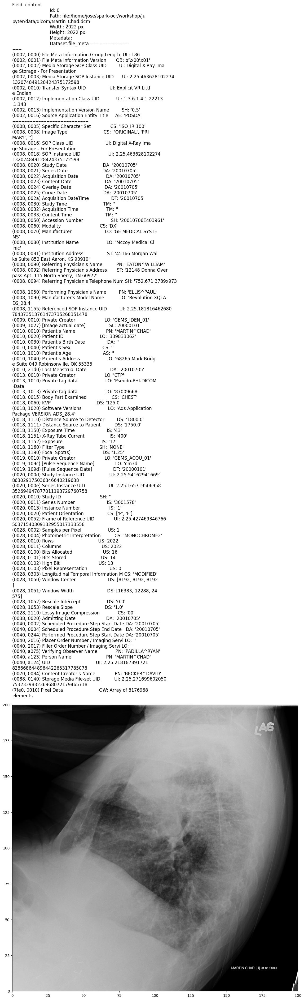

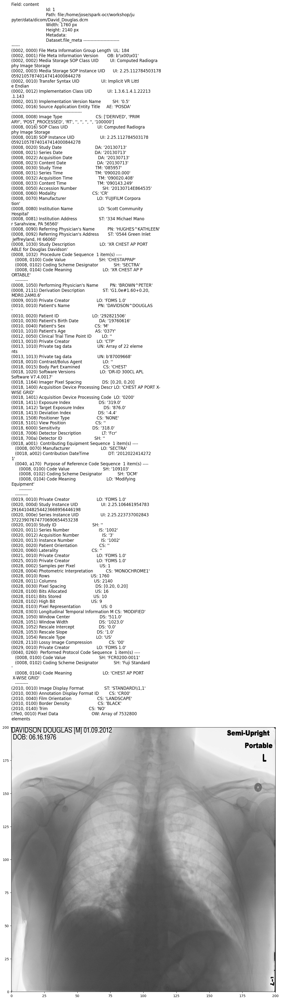

/home/jose/.local/lib/python3.8/site-packages/pydicom/valuerep.py:443: UserWarning: The value length (44) exceeds the maximum length of 16 allowed for VR SH.
  warnings.warn(msg)


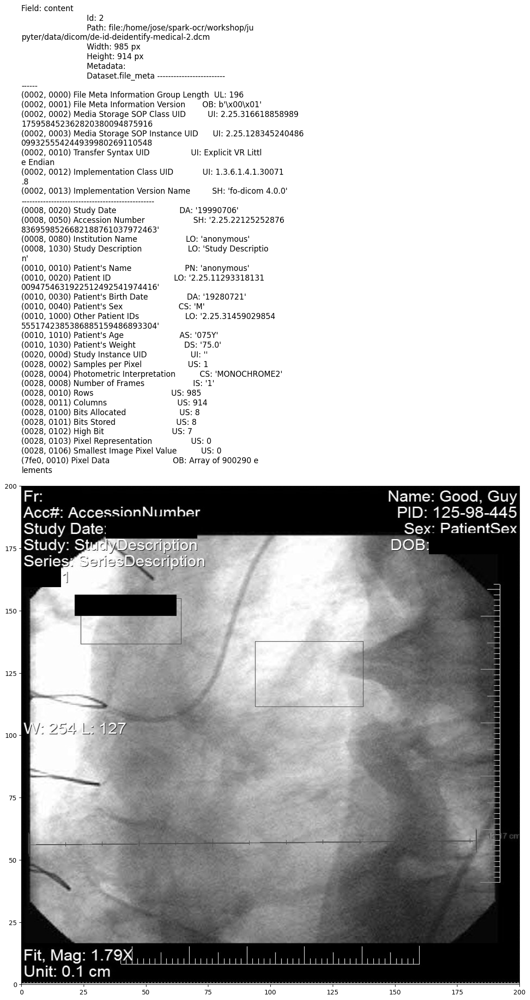

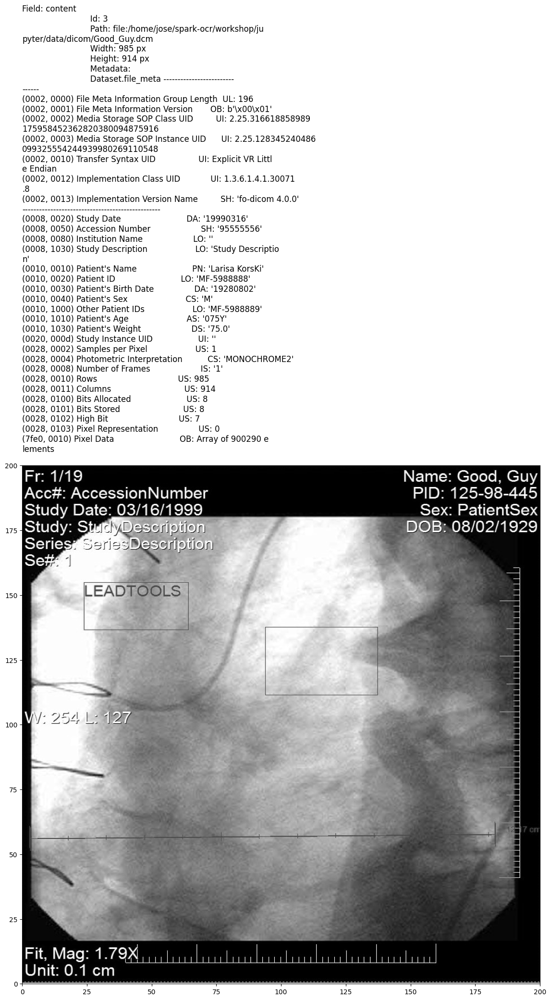

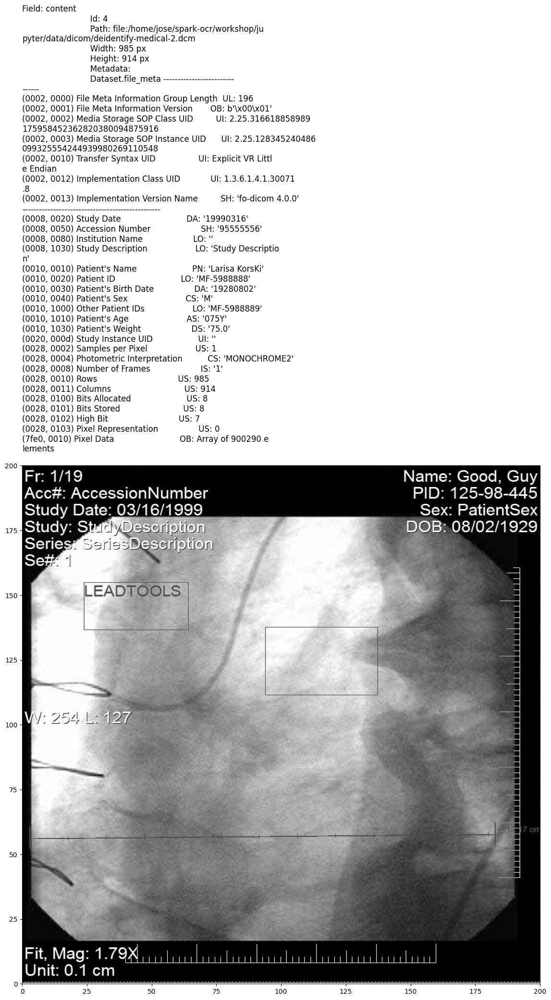

In [7]:
dicom_path = './../data/dicom/*.dcm'
dicom_df = spark.read.format("binaryFile").load(dicom_path)#.limit(1)

display_dicom(dicom_df)

# Call pipeline

In [11]:
result = pipeline.transform(dicom_df).cache()

## Show intermediate results for debug

#### <span style="color:red">Note:</span> Need to comment last two steps in the pipeline for run this cell !!!

In [10]:
# NBVAL_SKIP
import pandas as pd
pd.set_option('display.max_colwidth', 500)
result.select("text", "positions", "entity", "ner_chunk",
              "deid_merged_chunk", "coordinates", "exception").toPandas()

,text,positions,entity,ner_chunk,deid_merged_chunk,coordinates,exception
0,"Fr:\n1/19\nName:\nGood\nGuy\nAcc#:\nAccessionNumber\nPID:\n125-98-445\nStudy\nDate: 03/16/1999\nSex:\nPatientSex\nStudy: StwiWescnpuor\nDOB:.08/02/1929\nSeries#\nSerissMeserotor\nSet”\nLEADTOOLS\nWN: B54,\n127\n7\nFit.\nMag:\n1.79X\nUnit:\n0.1\ncm\n","[([Row(c='Fr:', x=3.0, y=5.0, width=40.0, height=30.0, fontSize=0, source=''), Row(c='1/19', x=47.0, y=5.0, width=64.0, height=30.0, fontSize=0, source=''), Row(c='Name:', x=670.0, y=5.0, width=90.0, height=30.0, fontSize=0, source=''), Row(c='Good', x=765.0, y=5.0, width=77.0, height=30.0, fontSize=0, source=''), Row(c='Guy', x=853.0, y=7.0, width=60.0, height=30.0, fontSize=0, source=''), Row(c='Acc#:', x=3.0, y=38.0, width=71.0, height=30.0, fontSize=0, source=''), Row(c='AccessionNumber'...","[(named_entity, 24, 29, Acc#:, {}, []), (named_entity, 30, 45, AccessionNumber, {}, [])]","[(chunk, 4, 7, 1/19, {'sentence': '0', 'chunk': '0', 'entity': 'DATE', 'confidence': '0.9987'}, []), (chunk, 15, 22, Good Guy, {'sentence': '0', 'chunk': '1', 'entity': 'NAME', 'confidence': '0.91365'}, []), (chunk, 30, 44, AccessionNumber, {'sentence': '0', 'chunk': '2', 'entity': 'NAME', 'confidence': '0.9449'}, []), (chunk, 51, 60, 125-98-445, {'sentence': '0', 'chunk': '3', 'entity': 'ID', 'confidence': '0.972'}, []), (chunk, 74, 83, 03/16/1999, {'sentence': '0', 'chunk': '4', 'entity': ...","[(chunk, 4, 7, 1/19, {'sentence': '0', 'chunk': '0', 'entity': 'DATE', 'confidence': '0.9987'}, []), (chunk, 15, 22, Good Guy, {'sentence': '0', 'chunk': '1', 'entity': 'NAME', 'confidence': '0.91365'}, []), (named_entity, 24, 29, Acc#:, {'chunk': '2', 'entity': 'UNK'}, []), (named_entity, 30, 45, AccessionNumber, {'chunk': '3', 'entity': 'UNK'}, []), (chunk, 51, 60, 125-98-445, {'sentence': '0', 'chunk': '4', 'entity': 'ID', 'confidence': '0.972'}, []), (chunk, 74, 83, 03/16/1999, {'sentenc...","[(0, 0, 47.0, 5.0, 64.0, 30.0, 0.0, 0, 0.0), (1, 0, 765.0, 6.0, 156.5, 30.0, 0.0, 0, 0.0), (2, 0, 3.0, 38.0, 71.0, 30.0, 0.0, 0, 0.0), (3, 0, 84.0, 36.0, 248.0, 34.0, 0.0, 0, 0.0), (4, 0, 754.0, 38.0, 159.0, 30.0, 0.0, 0, 0.0), (5, 0, 89.0, 67.0, 233.0, 34.0, 0.0, 0, 0.0), (6, 0, 104.0, 150.0, 50.5, 32.0, 0.0, 0, 0.0)]",
1,Chest\nAcc: 0545234234325V\nSe\n3/2\n2018 Oct 23\nIm: 1/1\nImg Tm: 14:23:53\nv\nLat: F\nName: John Stiles\nAge\n78\nDOB: 05/12/42\nDCM /id: ID\nW: 3498 L: 2000\n,"[([Row(c='Chest', x=22.0, y=37.0, width=47.0, height=19.0, fontSize=0, source=''), Row(c='Acc: 0545234234325V', x=515.0, y=34.0, width=166.0, height=19.0, fontSize=0, source=''), Row(c='Se', x=21.0, y=56.0, width=24.0, height=19.0, fontSize=0, source=''), Row(c='3/2', x=50.0, y=56.0, width=27.0, height=17.0, fontSize=0, source=''), Row(c='2018 Oct 23', x=515.0, y=53.0, width=92.0, height=19.0, fontSize=0, source=''), Row(c='Im: 1/1', x=20.0, y=73.0, width=54.0, height=19.0, fontSize=0, sourc...","[(named_entity, 0, 5, Chest, {}, []), (named_entity, 6, 25, Acc: 0545234234325V, {}, []), (named_entity, 33, 44, 2018 Oct 23, {}, []), (named_entity, 79, 96, Name: John Stiles, {}, [])]","[(chunk, 11, 24, 0545234234325V, {'sentence': '0', 'chunk': '0', 'entity': 'ID', 'confidence': '0.98'}, []), (chunk, 33, 43, 2018 Oct 23, {'sentence': '0', 'chunk': '1', 'entity': 'DATE', 'confidence': '0.73926663'}, []), (chunk, 49, 51, 1/1, {'sentence': '0', 'chunk': '2', 'entity': 'DATE', 'confidence': '0.8146'}, []), (chunk, 85, 95, John Stiles, {'sentence': '0', 'chunk': '3', 'entity': 'NAME', 'confidence': '0.98595'}, []), (chunk, 101, 102, 78, {'sentence': '0', 'chunk': '4', 'entity':...","[(named_entity, 0, 5, Chest, {'chunk': '0', 'entity': 'UNK'}, []), (named_entity, 6, 25, Acc: 0545234234325V, {'chunk': '1', 'entity': 'UNK'}, []), (named_entity, 33, 44, 2018 Oct 23, {'chunk': '2', 'entity': 'UNK'}, []), (chunk, 49, 51, 1/1, {'sentence': '0', 'chunk': '3', 'entity': 'DATE', 'confidence': '0.8146'}, []), (named_entity, 79, 96, Name: John Stiles, {'chunk': '4', 'entity': 'UNK'

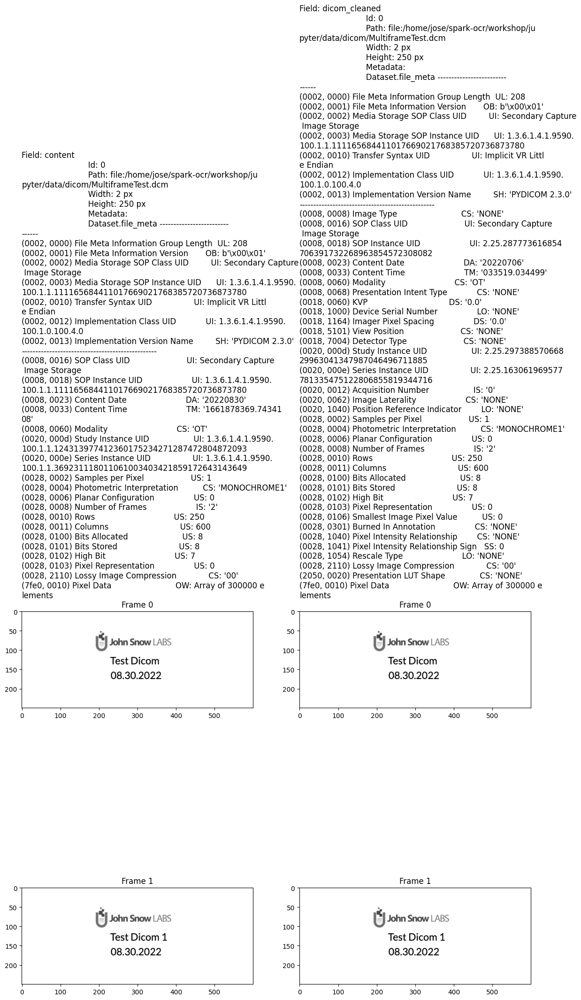

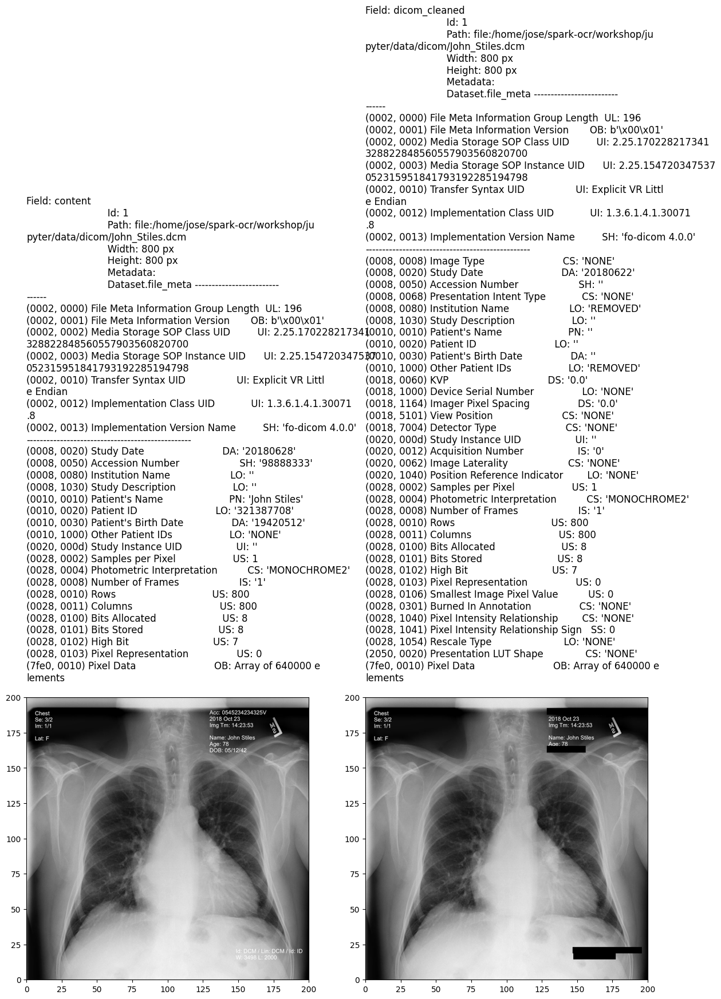

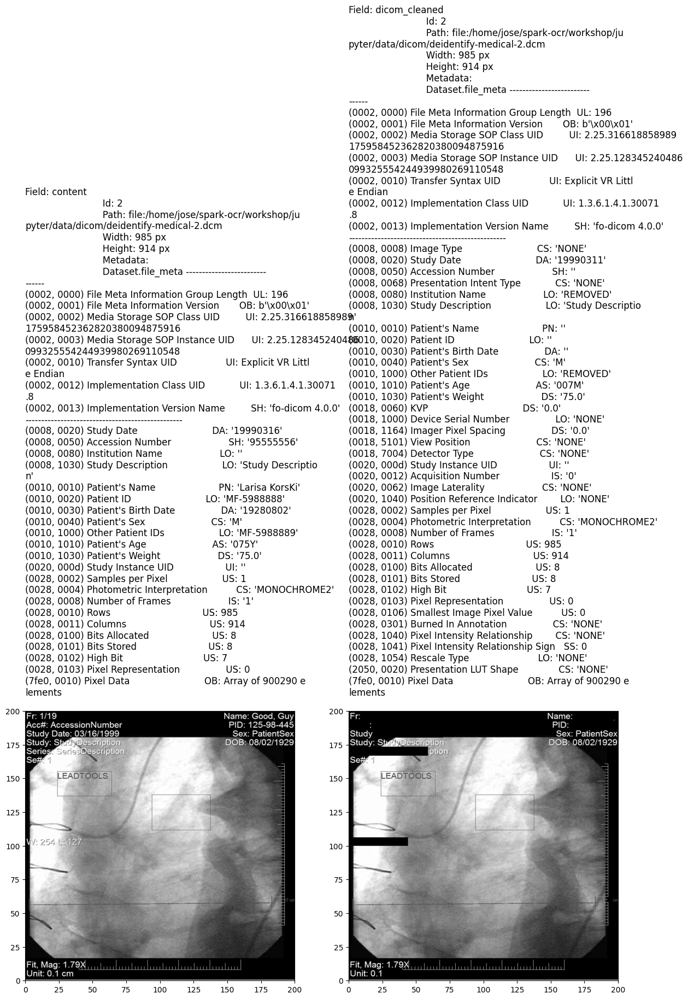

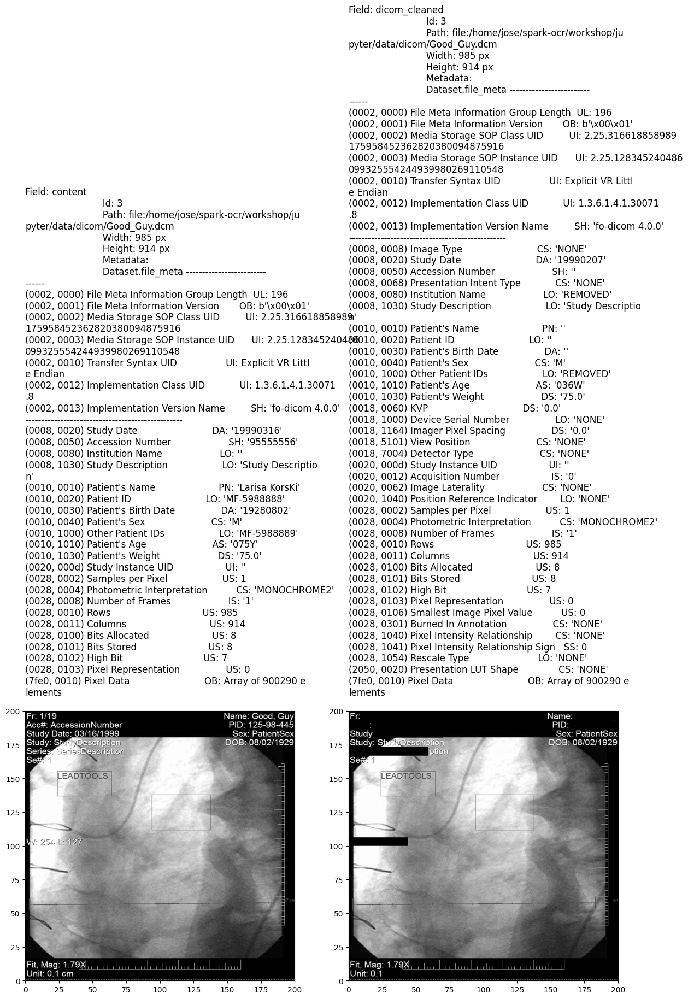

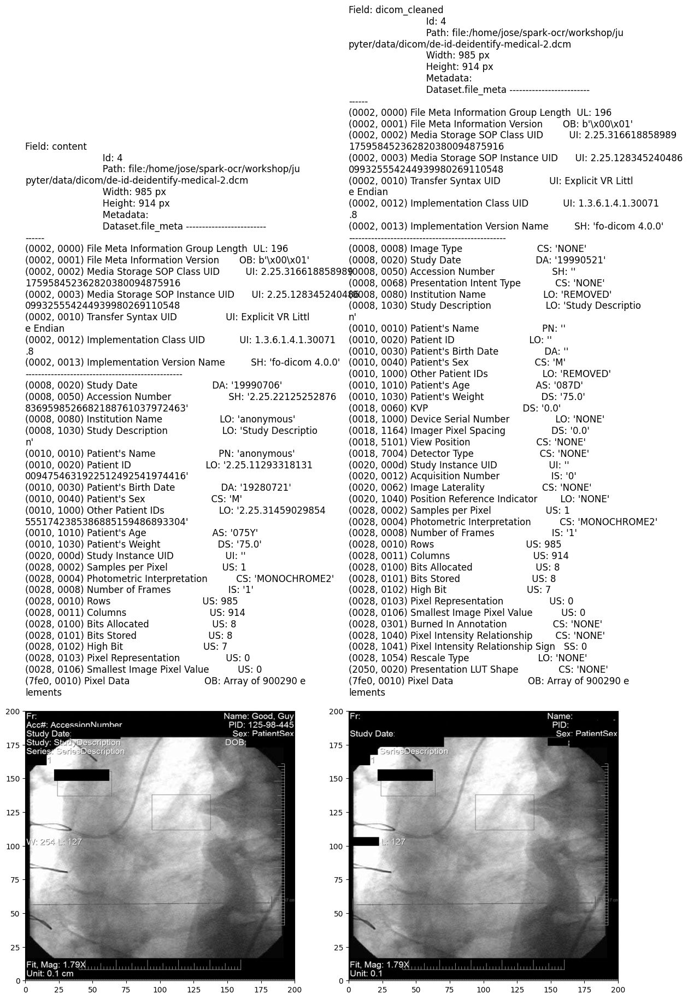

----------------------------------------
Exception happened during processing of request from ('127.0.0.1', 59136)
Traceback (most recent call last):
  File "/usr/lib/python3.8/socketserver.py", line 316, in _handle_request_noblock
    self.process_request(request, client_address)
  File "/usr/lib/python3.8/socketserver.py", line 347, in process_request
    self.finish_request(request, client_address)
  File "/usr/lib/python3.8/socketserver.py", line 360, in finish_request
    self.RequestHandlerClass(request, client_address, self)
  File "/usr/lib/python3.8/socketserver.py", line 747, in __init__
    self.handle()
  File "/home/jose/.local/lib/python3.8/site-packages/pyspark/accumulators.py", line 281, in handle
    poll(accum_updates)
  File "/home/jose/.local/lib/python3.8/site-packages/pyspark/accumulators.py", line 253, in poll
    if func():
  File "/home/jose/.local/lib/python3.8/site-packages/pyspark/accumulators.py", line 257, in accum_updates
    num_updates = read_int(self.r

In [13]:
display_dicom(result, "content, dicom_cleaned")

In [16]:
# NBVAL_SKIP
output_path = "./../data/dicom/deidentified/"
from pyspark.sql.functions import *

def get_name(path, keep_subfolder_level=0):
    path = path.split("/")
    path[-1] = path[-1].split('.')[0]
    return "/".join(path[-keep_subfolder_level-1:])

result.withColumn("fileName", udf(get_name, StringType())(col("path"))) \
    .write \
    .format("binaryFormat") \
    .option("type", "dicom") \
    .option("field", "dicom_cleaned") \
    .option("prefix", "ocr_") \
    .option("nameField", "fileName") \
    .mode("overwrite") \
    .save(output_path)

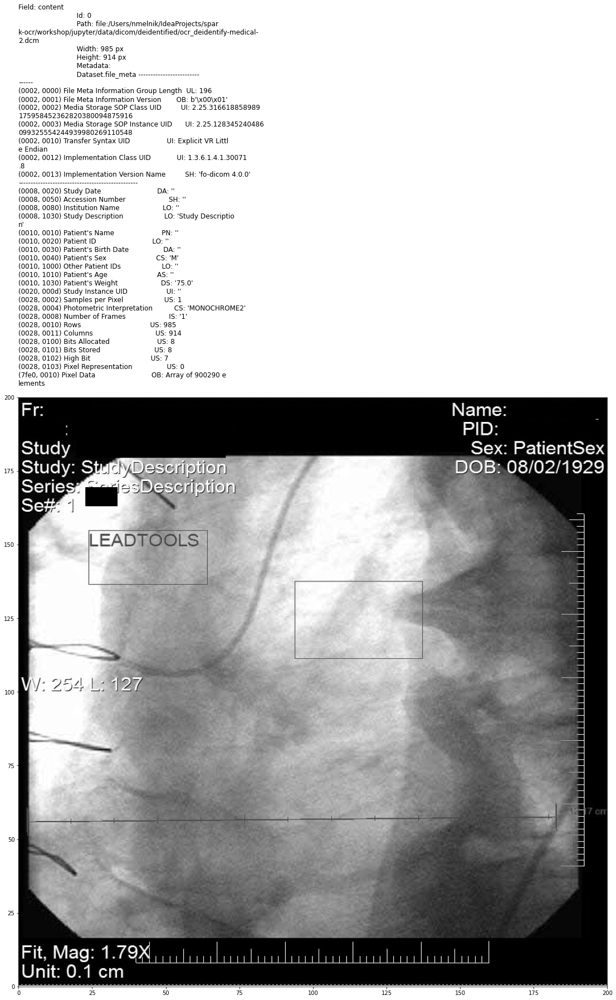

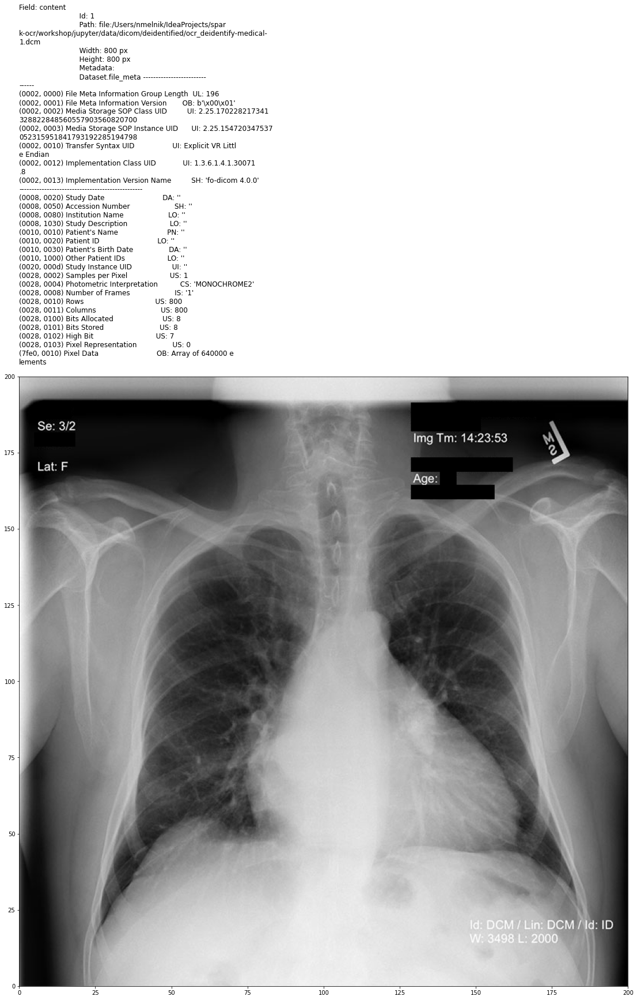

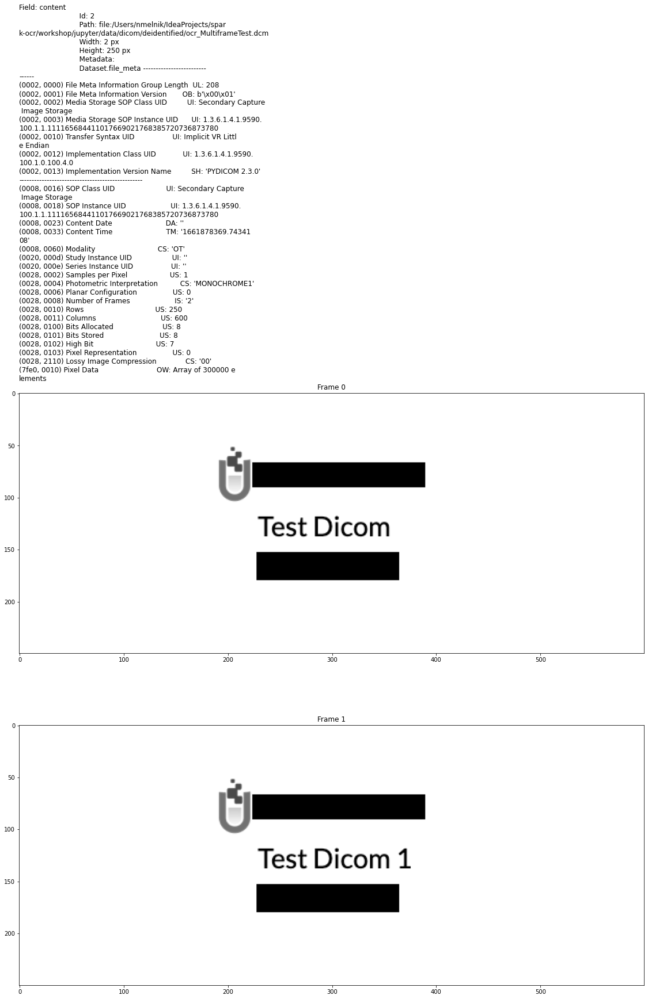

In [17]:
# NBVAL_SKIP
dicom_gen_df = spark.read.format("binaryFile").load("./../data/dicom/deidentified/*.dcm")

display_dicom(dicom_gen_df)

### DicomDeidentifier Internals

In [8]:
import pkg_resources, pandas as pd

strategy_file = pkg_resources.resource_filename('sparkocr', 'resources/ocr/dicom/default_dicom_strategy.csv')
pd.read_csv(strategy_file)

,Tags,VR,Name,Status,Action
0,"(0002,0100)",UI,Private Information Creator UID,NaN,Hashid
1,"(0002,0102)",OB,Private Information,NaN,Hashid
2,"(0004,1130)",CS,File-set ID,NaN,Hashid
3,"(0004,1141)",CS,File-set Descriptor File ID,NaN,Hashid
4,"(0004,1432)",UI,Private Record UID,NaN,Hashid
...,...,...,...,...,...
151,"(4008,0119)",PN,Distribution Name,Retired,Remove
152,"(4008,011A)",LO,Distribution Address,Retired,Remove
153,"(4008,0202)",LO,Interpretation ID Issuer,Retired,Remove
154,"(FFFC,FFFC)",OB,Data Set Trailing Padding,NaN,Remove


In [23]:
%%bash
rm -r -f ./../data/dicom/deidentified